In [1]:
import numpy
import matplotlib.pyplot as plt
from IPython.display import Audio
from IPython.display import Image
from scipy import signal
from scipy.fftpack import fftshift
from scipy.fftpack import fft, fftfreq
from scipy.io import wavfile
plt.rcParams['figure.figsize'] = [12, 4]
from IPython.core.display import HTML
from matplotlib import animation, rc
from IPython.display import HTML
from IPython.display import clear_output
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")


## Phasor - the central abstraction

Sine wave? Fundamentally, a sinusoid is generated by projecting a rotating phasor onto the imaginary axis in a complex plane. 
Imagine that the phasor spins with a constant angular speed: $\color{blue}{\omega}$. This is the angular frequency of the sinusoid: $\color{blue}{\sin(\omega t)}$. In physical terminology, we call it the angular frequency of our oscillations in our signal. 

Analogy: [Shadow cast by the phasor on a wall beyond it](https://www.khanacademy.org/science/in-in-class-12th-physics-india/x51bd77206da864f3:alternating-current/x51bd77206da864f3:phasor-diagrams/v/phasor-diagram-its-applications). 

Importance: Understand phase relationships between oscillations and also add/subtract oscillations. 

In [9]:
angles = numpy.linspace(0, 2*numpy.pi, 256)

# First set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots(figsize=(21, 7.77))

ax.set_xlim((-1.57, 7.85))
ax.set_ylim((-1.57, 2.0))
# ax.plot([-1.3, -0.6], [1.33, 1.33], 'b-')

ann = ax.annotate("Phase angle (rad): 0", xy=(-1.3, 1.78), xytext=(-1.3, 1.78), fontsize=24, alpha=0.5)
#ann1 = ax.annotate("Phase angle, scaled to 0-$2^{32}$ and represented in binary (\"Accumulator\")",
#                   xy=(-1.3, 1.5), xytext=(-1.3, 1.5), fontsize=18, alpha=0.4)
#ann2 = ax.annotate('{0:032b}'.format(0), xy=(-1.3, 1.35), xytext=(-1.3, 1.35), fontsize=18, alpha=0.4)

# ann3 = ax.annotate('indexes into 256-entry sine table',
#             xy=(-0.95, 1.33),
#             xytext=(0.01, 0.75), textcoords='axes fraction',
#             arrowprops=dict(facecolor='black', shrink=0.01),
#             horizontalalignment='left', verticalalignment='top')


line, = ax.plot(numpy.cos(angles), numpy.sin(angles))
line1, = ax.plot([],[], 'black', alpha=0.1)
line2, = ax.plot([], [], 'black', alpha=0.1)
line3, = ax.plot([],[], 'green', linewidth=2)
line4, = ax.plot([], [], 'r.')
line5, = ax.plot([], [], 'orange')
line6, = ax.plot([], [], 'r-')
line7, = ax.plot([], [], 'r-')



# initialization function: plot the background of each frame
def init():
    line.set_data(numpy.cos(angles), numpy.sin(angles))
    line1.set_data([-1.1, 1.1], [0, 0])
    line2.set_data([0, 0], [-1.1, 1.1])
    line3.set_data([0, 0],[0, numpy.sin(0)])
    line4.set_data(0, numpy.sin(0))
    line5.set_data(numpy.linspace(0, 7.85, 256), numpy.sin(0 - numpy.linspace(0, 7.85, 256)))
    line6.set_data([0, numpy.cos(0)], [0, numpy.sin(0)])
    line7.set_data([], [])
    
    return (line, line1, line2, line3, line4, line5, line6, line7,)


def animate(i):
    global ann
    #global ann2
    ann.remove()
    #ann2.remove()
    line.set_data(numpy.cos(angles), numpy.sin(angles))
    line1.set_data([-1.1, 1.1], [0, 0])
    line2.set_data([0, 0], [-1.1, 1.1])
    line3.set_data([0, 0],[0, numpy.sin(angles[i])])
    line4.set_data(0, numpy.sin(angles[i]))
    line5.set_data(numpy.linspace(0, 7.85, 256), numpy.sin(angles[i] - numpy.linspace(0, 7.85, 256)))
    line6.set_data([0, numpy.cos(angles[i])], [0, numpy.sin(angles[i])])
    line7.set_data(numpy.cos(numpy.linspace(0, angles[i], 100))*0.1, numpy.sin(numpy.linspace(0, angles[i], 100))*0.1)
    ann = ax.annotate("Phase angle (rad): "+str(angles[i]),
                      xy=(-1.3, 1.78), xytext=(-1.3, 1.78), fontsize=18, alpha=0.4)
    OldRange = 2*numpy.pi  
    NewRange = (2**32.)  
    NewValue = (((angles[i]) * NewRange) / OldRange)
    #ann2 = ax.annotate('{0:032b}'.format(int(NewValue)), xy=(-1.3, 1.35),
    #                   xytext=(-1.3, 1.35), fontsize=18, alpha=0.4)
    return (line, line1, line2, line3, line4, line5, line6, line7,)

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=256, interval=20, blit=True)
rc('animation', html='jshtml')

plt.close()



In [10]:
anim

## Discrete domain

In the digital world, events are observed in intervals of discrete observations - ${\color{blue}{samples}}$. 

### Nyquist Sampling Theorem
A continuous signal can be reconstructed as long as there are __two samples__ per period for the highest frequency component in the underlying signal. That is, for perfect reconstruction, our sampling frequency must be at least twice as fast as the highest frequency in our continuous signal. 

$$f_\text{sampling} = 2 * f_\text{signal}$$

### Nyquist Limit
Imagine that our digitizer can sample at 100 Hz (read: 100 samples per second). Because we need at least two samples per period to reconstruct the signal, our incoming signal can change from 0 to 50 Hz. That is to say, for our analysis, the signal is limited to oscillate between 0 cycles/sec to 50 cycles/sec.

Question: How fast our sampler should be to digitize audio signals? 

In frequency domain

## References:
- [Hunter Adams, Direct Digital Synthesis](https://www.khanacademy.org/science/in-in-class-12th-physics-india/x51bd77206da864f3:alternating-current/x51bd77206da864f3:phasor-diagrams/v/phasor-diagram-its-applications)


<IPython.core.display.Javascript object>


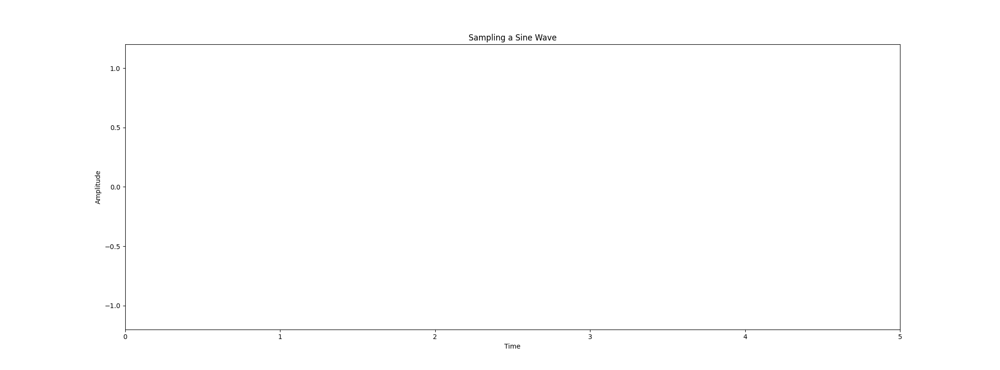

In [8]:
import matplotlib.animation as animation
from ipywidgets import *
import numpy 

f_signal = 10
t_0 = 0
t_f = 5

time_ = numpy.linspace(t_0, t_f, 256)

fig, ax = plt.subplots(figsize=(21, 7.77))
ax.set_ylim([-1.2, 1.2])
ax.set_xlim([t_0, t_f])
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')
ax.set_title('Sampling a Sine Wave')

line, = ax.plot([], [], 'r-', lw=2)
sampling_points, = ax.plot([], [], 'bo')
text = ax.text(0.05, 0.95, '', transform=ax.transAxes)

def animate_sampling(i):
    # Calculate the current sampling rate
    sampling_rate = (i + 1) * signal_freq
    
    # Calculate the Nyquist frequency and limit
    nyquist_freq = sampling_rate / 2
    nyquist_limit = 1 / (2 * signal_freq)
    
    # Generate the sine wave to be sampled
    sine_wave = np.sin(2 * np.pi * signal_freq * t_range)
    
    # Calculate the sampling interval
    sampling_interval = 1 / sampling_rate
    
    # Sample the sine wave
    sampled_wave = sine_wave[::int(sampling_interval/t_step)]
    
    # Update the plot elements
    line.set_data(t_range, sine_wave)
    sampling_points.set_data(t_range[::int(sampling_interval/t_step)], sampled_wave)
    text.set_text('Sampling Frequency: {:.2f} Hz\nSignal Frequency: {:.2f} Hz'.format(sampling_rate, signal_freq))
    
    # Draw the Nyquist limit line
    nyquist_line = ax.axvline(x=nyquist_limit, color='g', linestyle='--')
    
    return [line, sampling_points, text, nyquist_line]

# Create the animation
ani = animation.FuncAnimation(fig, animate_sampling, frames=20, repeat=True, interval=1000)

plt.show()
    

<IPython.core.display.Javascript object>


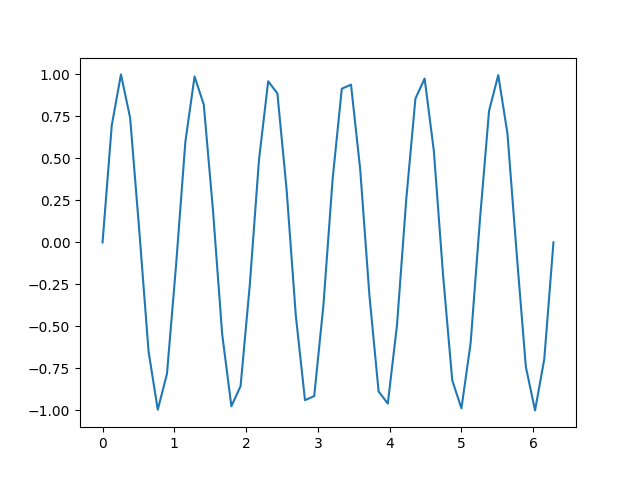

interactive(children=(FloatSlider(value=2.0, description='w', max=6.0, min=-2.0), Output()), _dom_classes=('wi…

In [6]:
%matplotlib notebook
from ipywidgets import *
import numpy as np
import matplotlib.pyplot as plt
 

x = np.linspace(0, 2 * np.pi)
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
line, = ax.plot(x, np.sin(x))

def update(w = 2.0):
    line.set_ydata(np.sin(w * x))
    fig.canvas.draw_idle()

interact(update);